# 전체 실행 run all하지 말것

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['font.family'] = 'NanumGothic'
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('float_format', '{:f}'.format)
%matplotlib inline

import matplotlib.font_manager as fm

for font in fm.fontManager.ttflist:
    if font.name in ['AppleGothic', 'Malgun Gothic']:
        plt.rcParams['font.family'] = font.name
        break

plt.rcParams['font.family']

import matplotlib
import plotly.express as px
import plotly.graph_objects as go

# warning message 제거
import warnings
warnings.filterwarnings('ignore')

In [2]:
group4=pd.read_csv('../03.ButterKnife/prime_group4.csv')

In [4]:
group4.shape

(38, 2)

1208 영화 662개 픽스로 영화 10개 늘어남

In [12]:
group4

,영화명,총공급좌석수
0,곤지암,6135078.000000
1,공작,6010785.000000
2,국가부도의 날,6971192.000000
3,군함도,6202985.000000
4,귀향,5963190.000000
5,그것만이 내 세상,6085408.000000
6,너의 결혼식,6641620.000000
7,더 킹,6814574.000000
8,덕혜옹주,5614881.000000
9,마녀,5312295.000000


In [5]:
df.shape

(28, 2)

In [5]:
screen=pd.read_csv('../01.Data_Collection/screens_final.csv')

In [10]:
screen.head(1)

,영화코드,영화명,개봉일,점유율집계일,개봉n일차,개봉n일차(int),상영횟수,상영점유율,상영점유율순위,스크린수,스크린점유율,스크린점유율순위,좌석수,좌석판매율,좌석점유율,좌석점유율순위,매출액,누적매출액,관객수,누적관객수
0,20147947,워킹걸,2015-01-07,2015-01-05,-2 days +00:00:00.000000000,-2,4,0.043000,13,4,0.200000,11,789,76.800000,0.030000,11,4848000,22924000,606,2975


In [6]:
frate=pd.read_csv('../01.Data_Collection/films_final.csv')

In [7]:
frate = frate[['영화명', 'F-rated']]

In [11]:
merged = screen.merge(group4, on='영화명', how='inner')

In [12]:
merged = merged.sort_values(by ='점유율집계일')

In [13]:
merged= merged.merge(frate, on='영화명', how='inner')

In [14]:
merged.head(1)

,영화코드,영화명,개봉일,점유율집계일,개봉n일차,개봉n일차(int),상영횟수,상영점유율,상영점유율순위,스크린수,스크린점유율,스크린점유율순위,좌석수,좌석판매율,좌석점유율,좌석점유율순위,매출액,누적매출액,관객수,누적관객수,총공급좌석수,F-rated
0,20149570,조선명탐정 : 사라진 놉의 딸,2015-02-11,2015-02-02,-9 days +00:00:00.000000000,-9,4,0.047000,15,4,0.200000,14,869,100.000000,0.040000,12,6083000,6083000,869,869,5791947.000000,1


In [15]:
merged.shape

(2939, 22)

### group 4 with F rate 저장

In [17]:
merged.to_csv('../01.Data_Collection/screens_final_with_group4_frate.csv')

In [80]:
merged.columns

Index(['스크린점유율순위', '영화명', '개봉일', '스크린수', '스크린점유율', '매출액', '누적매출액', '관객수',
       '누적관객수', '점유율집계일', '좌석판매점유율순위', '좌석판매율', '좌석점유율', '좌석수', '순위', '상영횟수',
       '상영점유율', '개봉n일차', '개봉n일차(int)', '총공급좌석수', 'F-rated'],
      dtype='object')

In [16]:
merged['영화명'].unique()

array(['조선명탐정 : 사라진 놉의 딸', '스물', '귀향', '시간이탈자', '아가씨', '인천상륙작전', '덕혜옹주',
       '아수라', '형', '판도라', '재심', '조작된 도시', '프리즌', '보안관', '박열', '군함도',
       '살인자의 기억법', '아이 캔 스피크', '남한산성', '강철비', '그것만이 내 세상',
       '조선명탐정: 흡혈괴마의 비밀', '리틀 포레스트', '사라진 밤', '지금 만나러 갑니다', '곤지암',
       '바람 바람 바람', '마녀', '목격자', '공작', '창궐', '말모이', '내안의 그놈', '생일', '증인',
       '사바하', '변신', '유열의 음악앨범'], dtype=object)

In [37]:
# merged['영화명'].unique() 
# 바뀌기 전 내용

array(['조선명탐정 : 사라진 놉의 딸', '스물', '연평해전', '귀향', '아가씨', '인천상륙작전', '덕혜옹주',
       '판도라', '더 킹', '프리즌', '군함도', '살인자의 기억법', '청년경찰', '아이 캔 스피크',
       '그것만이 내 세상', '지금 만나러 갑니다', '곤지암', '탐정: 리턴즈', '마녀', '너의 결혼식', '공작',
       '안시성', '국가부도의 날', '말모이', '증인', '사바하', '악인전', '봉오동 전투'],
      dtype=object)

In [34]:
merged =merged.reset_index(drop=True)

In [85]:
merged = merged[['영화명','점유율집계일','매출액','개봉n일차(int)','좌석판매율','좌석수','스크린수','관객수','좌석점유율','상영횟수','총공급좌석수', 'F-rated']]

In [112]:
sm =merged[merged['영화명']=='스물']
agss =merged[merged['영화명']=='아가씨']
mme =merged[merged['영화명']=='말모이']
ics =merged[merged['영화명']=='아이 캔 스피크']
# cngc =merged[merged['영화명']=='청년경찰']

In [89]:
data.haed()

,영화명,점유율집계일,매출액,개봉n일차(int),좌석판매율,좌석수,스크린수,관객수,좌석점유율,상영횟수,총공급좌석수,F-rated
50,스물,2015-03-04,1464000,-21,100.000000,183,1,183,0.010000,1,6029770.000000,0
51,스물,2015-03-09,1956000,-16,100.000000,326,1,326,0.010000,1,6029770.000000,0
52,스물,2015-03-12,34636000,-13,100.000000,4238,22,4238,0.180000,22,6029770.000000,0
53,스물,2015-03-13,44877000,-12,98.900000,5353,26,5295,0.220000,26,6029770.000000,0
54,스물,2015-03-14,6246000,-11,92.900000,747,3,694,0.030000,3,6029770.000000,0


In [106]:
print(merged[merged['F-rated']==0]['영화명'].unique())
print(merged[merged['F-rated']==1]['영화명'].unique())
print(merged[merged['F-rated']==2]['영화명'].unique())

['스물' '연평해전' '인천상륙작전' '판도라' '더 킹' '프리즌' '군함도' '살인자의 기억법' '청년경찰'
 '그것만이 내 세상' '지금 만나러 갑니다' '곤지암' '공작' '안시성' '증인' '사바하' '악인전' '봉오동 전투']
['조선명탐정 : 사라진 놉의 딸' '귀향' '아가씨' '덕혜옹주' '탐정: 리턴즈' '마녀' '너의 결혼식' '국가부도의 날']
['아이 캔 스피크' '말모이']


In [31]:
df.groupby('F-rated')['영화명'].count()

F-rated
0    1444
1     662
2     225
Name: 영화명, dtype: int64

In [44]:
# values= df.groupby('F-rated')['영화명'].count()
fig = go.Figure(data=[go.Pie(labels=[0,1,2], values=[1444,662,225])])
fig.update_layout(
    title="F-rate ratio")
fig.show()

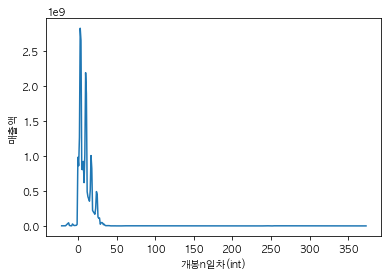

In [133]:
# data = merged.loc[merged['영화명'] == '스물', ['개봉n일차(int)', '좌석판매율']]
sns.lineplot(x='개봉n일차(int)', y='매출액', data=data)
# plt.xticks(rotation=45)
plt.show()

In [ ]:
plt.figure(figsize=[20, 6])
# sns.barplot(x='개봉n일차(int)', y='좌석판매율', data=data, color='red')
sns.barplot(x='개봉n일차(int)', y='좌석판매율', data=data1, color='black')
plt.show()

### 아가씨

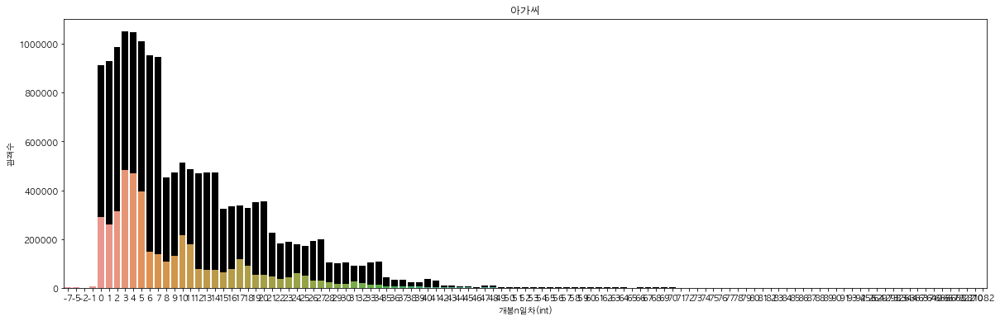

In [129]:
plt.figure(figsize=[20, 6])
plt.title("아가씨")

sns.barplot(x='개봉n일차(int)', y='좌석수', data=agss, color='black')
sns.barplot(x="개봉n일차(int)", y="관객수", data=agss)
# ax.set(xlim=(0, 30))
plt.show()

# sm =merged[merged['영화명']=='스물']
# agss =merged[merged['영화명']=='아가씨']
# mme =merged[merged['영화명']=='말모이']
# ics =merged[merged['영화명']=='아이 캔 스피크']
# cngc =merged[merged['영화명']=='청년경찰']

- 좌석수 대비 관객수
- 주차별로 변하는 패턴이 보임(관객수가 느는 날은 보통 주말)

### 청년경찰

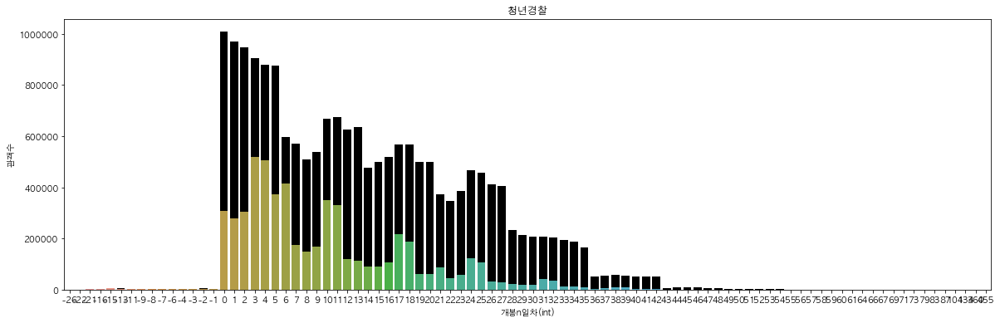

In [130]:
plt.figure(figsize=[20, 6])
plt.title("청년경찰")

sns.barplot(x='개봉n일차(int)', y='좌석수', data=cngc, color='black')
sns.barplot(x="개봉n일차(int)", y="관객수", data=cngc)
# ax.set(xlim=(0, 30))
plt.show()

# sm =merged[merged['영화명']=='스물']
# agss =merged[merged['영화명']=='아가씨']
# mme =merged[merged['영화명']=='말모이']
# ics =merged[merged['영화명']=='아이 캔 스피크']
# cngc =merged[merged['영화명']=='청년경찰']

청년경찰도 개봉 3,4일차, 10,11일차 주말임

In [17]:
df[df['영화명']=='청년경찰']['개봉n일차(int)'].isin([3,4])

1009    False
1010    False
1011    False
1012    False
1013    False
1014    False
1015    False
1016    False
1017    False
1018    False
1019    False
1020    False
1021    False
1022    False
1023    False
1024    False
1025    False
1026    False
1027     True
1028     True
1029    False
1030    False
1031    False
1032    False
1033    False
1034    False
1035    False
1036    False
1037    False
1038    False
1039    False
1040    False
1041    False
1042    False
1043    False
1044    False
1045    False
1046    False
1047    False
1048    False
1049    False
1050    False
1051    False
1052    False
1053    False
1054    False
1055    False
1056    False
1057    False
1058    False
1059    False
1060    False
1061    False
1062    False
1063    False
1064    False
1065    False
1066    False
1067    False
1068    False
1069    False
1070    False
1071    False
1072    False
1073    False
1074    False
1075    False
1076    False
1077    False
1078    False
1079    False
1080  

In [19]:

agss =df[df['영화명']=='아가씨']
sm =df[df['영화명']=='스물']
mme =df[df['영화명']=='말모이']
ics =df[df['영화명']=='아이 캔 스피크']
cngc =df[df['영화명']=='청년경찰']

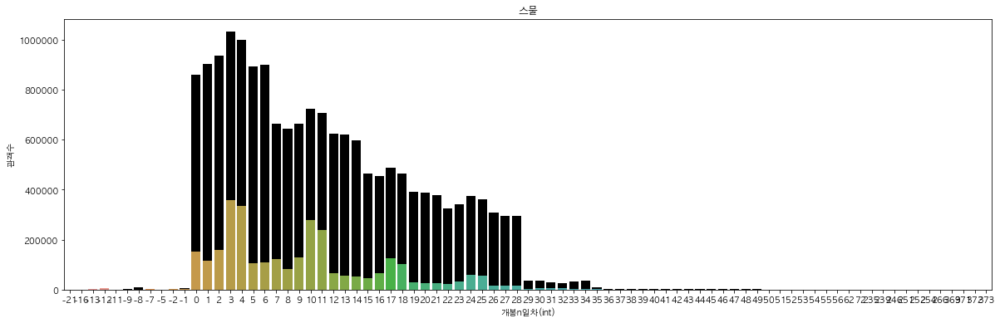

In [20]:
plt.figure(figsize=[20, 6])
plt.title("스물")

sns.barplot(x='개봉n일차(int)', y='좌석수', data=sm, color='black')
sns.barplot(x="개봉n일차(int)", y="관객수", data=sm)
# ax.set(xlim=(0, 30))
plt.show()


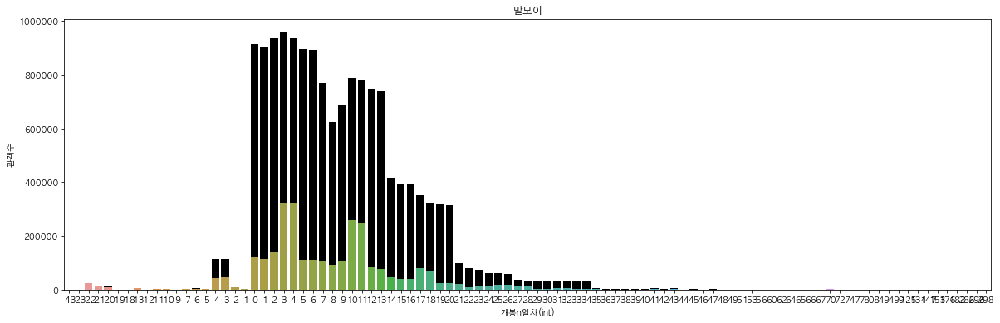

In [21]:
plt.figure(figsize=[20, 6])
plt.title("말모이")

sns.barplot(x='개봉n일차(int)', y='좌석수', data=mme, color='black')
sns.barplot(x="개봉n일차(int)", y="관객수", data=mme)
# ax.set(xlim=(0, 30))
plt.show()

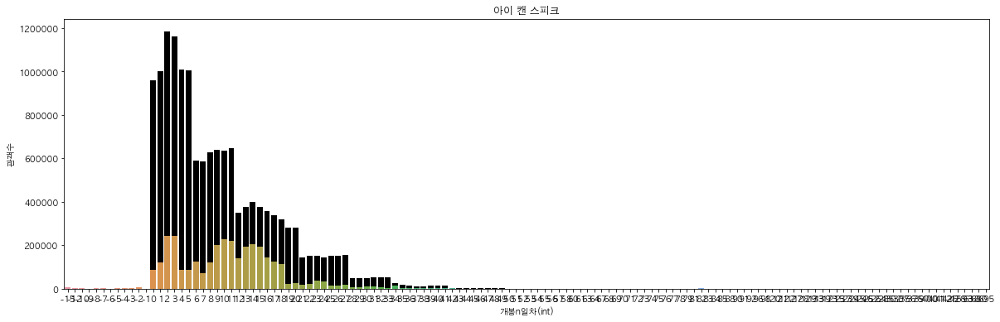

In [22]:
plt.figure(figsize=[20, 6])
plt.title("아이 캔 스피크")

sns.barplot(x='개봉n일차(int)', y='좌석수', data=ics, color='black')
sns.barplot(x="개봉n일차(int)", y="관객수", data=ics)
# ax.set(xlim=(0, 30))
plt.show()

In [117]:
fig = px.scatter(merged, x="좌석수", y="관객수", color="F-rated",
                 size='매출액')
fig.show()

같은 내용 f rate 별로 보기

In [7]:
f0= df[df['F-rated']==0]
f1= df[df['F-rated']==1]
f2= df[df['F-rated']==2]

In [9]:
fig = px.scatter(f0, x="좌석수", y="관객수",
                 size='매출액')
fig.update_layout(
    title="Plot f0")
fig.show()

In [10]:
fig = px.scatter(f1, x="좌석수", y="관객수",
                 size='매출액')
fig.update_layout(
    title="Plot f1")
fig.show()

In [11]:
fig = px.scatter(f2, x="좌석수", y="관객수",
                 size='매출액')
fig.update_layout(
    title="Plot f2")
fig.show()

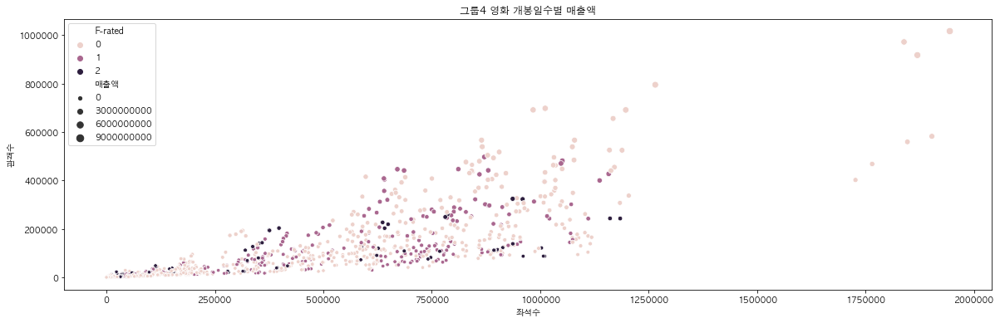

In [110]:
plt.figure(figsize=[20, 6])
plt.title("그룹4 영화 개봉일수별 매출액")
ax= sns.scatterplot(x='좌석수', y='관객수', data=merged, hue='F-rated', size="매출액")
# ax.set(xlim=(0, 30))
plt.show()

In [ ]:
plt.figure(figsize=[20, 6])
plt.title("그룹4 영화 개봉일수별 매출액")
ax= sns.barplot(x='개봉n일차(int)', y='좌석판매율', data=data, hue='F-rated')
ax.set(xlim=(0, 30))
plt.show()

In [123]:
merged.sort_values(by='개봉n일차(int)', ascending=False)

,영화명,점유율집계일,매출액,개봉n일차(int),좌석판매율,좌석수,스크린수,관객수,좌석점유율,상영횟수,총공급좌석수,F-rated
343,귀향,2018-04-20,56000,3088,5.600000,504,1,28,0.020000,3,5963190.000000,1
342,귀향,2018-04-19,74000,3087,7.300000,504,1,37,0.020000,3,5963190.000000,1
341,귀향,2018-04-18,52000,3086,5.200000,504,1,26,0.020000,3,5963190.000000,1
456,아가씨,2019-05-19,469000,1082,29.000000,152,1,44,0.010000,1,5122742.000000,1
739,판도라,2019-09-20,861000,1017,107.900000,114,1,123,0.000000,1,6090015.000000,0
558,인천상륙작전,2019-02-18,6200000,936,100.000000,675,2,675,0.020000,2,5191021.000000,0
738,판도라,2019-06-24,700000,929,100.000000,100,1,100,0.000000,1,6090015.000000,0
799,더 킹,2019-06-22,814000,885,100.000000,72,1,72,0.000000,1,6814574.000000,0
798,더 킹,2019-06-14,2674000,877,63.400000,306,1,194,0.010000,1,6814574.000000,0
455,아가씨,2018-10-19,0,870,0.000000,212,1,0,0.010000,1,5122742.000000,1


### 1207

In [112]:
df=pd.read_csv('../01.Data_Collection/screen_show_seat_with_group4_frate.csv')

In [113]:
df= df.drop(columns='Unnamed: 0',axis=1)

In [89]:
df.head()

,영화명,점유율집계일,매출액,개봉n일차(int),좌석판매율,좌석수,스크린수,관객수,좌석점유율,상영횟수,총공급좌석수,F-rated
0,조선명탐정 : 사라진 놉의 딸,2015-02-02,6083000,-9,100.000000,869,4,869,0.040000,4,5203321.000000,1
1,조선명탐정 : 사라진 놉의 딸,2015-02-03,18225000,-8,100.000000,2025,9,2025,0.090000,9,5203321.000000,1
2,조선명탐정 : 사라진 놉의 딸,2015-02-04,23160000,-7,97.400000,2972,14,2895,0.130000,14,5203321.000000,1
3,조선명탐정 : 사라진 놉의 딸,2015-02-05,16891000,-6,99.500000,2425,7,2413,0.100000,7,5203321.000000,1
4,조선명탐정 : 사라진 놉의 딸,2015-02-11,853823300,0,14.900000,762037,740,113443,32.280000,3670,5203321.000000,1


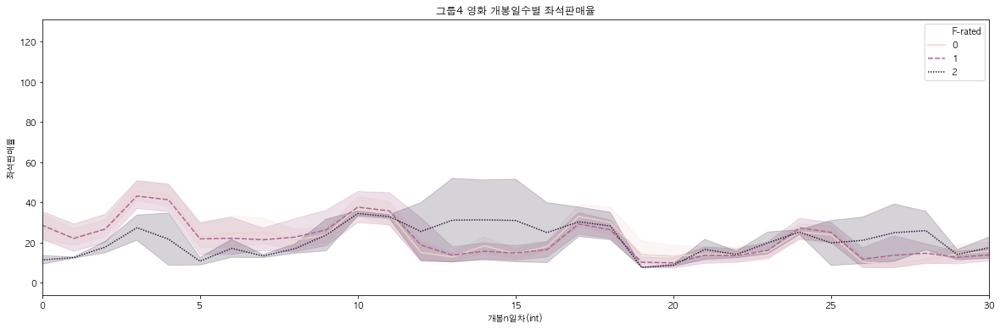

In [52]:
plt.figure(figsize=[20, 6])
plt.title("그룹4 영화 개봉일수별 좌석판매율")
ax= sns.lineplot(x='개봉n일차(int)', y='좌석판매율', data=df, style='F-rated', hue='F-rated')
ax.set(xlim=(0, 30))
plt.show()

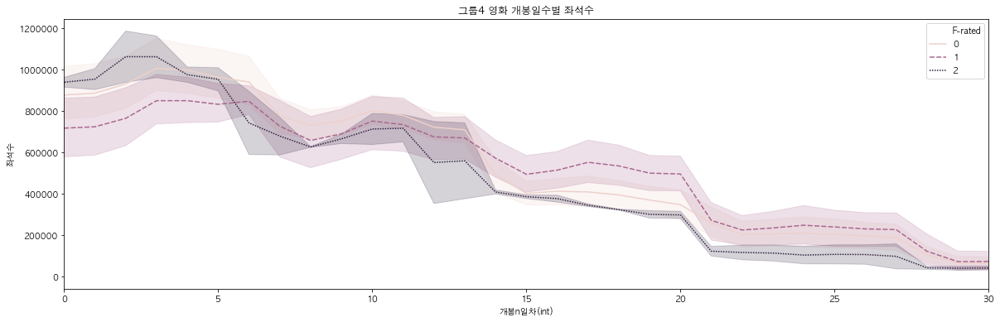

In [69]:
plt.figure(figsize=[20, 6])
plt.title("그룹4 영화 개봉일수별 좌석수")
ax= sns.lineplot(x='개봉n일차(int)', y='좌석수', data=df, style='F-rated', hue='F-rated')
ax.set(xlim=(0, 30))
plt.show()

## 그래프 해석
- f2 영화의 경우 후반까지(15일차, 25일차) 다소 높은 좌석판매율을 보여줌
- f2 영화의 경우 개봉 15일차 가면서 좌석수가 f0,f1에 비해 떨어짐

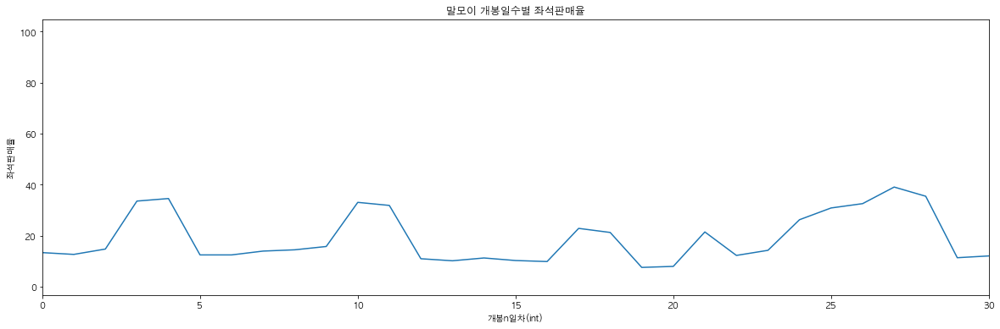

In [71]:
plt.figure(figsize=[20, 6])
plt.title("말모이 개봉일수별 좌석판매율")
ax= sns.lineplot(x='개봉n일차(int)', y='좌석판매율', data=mme)
ax.set(xlim=(0, 30))
plt.show()

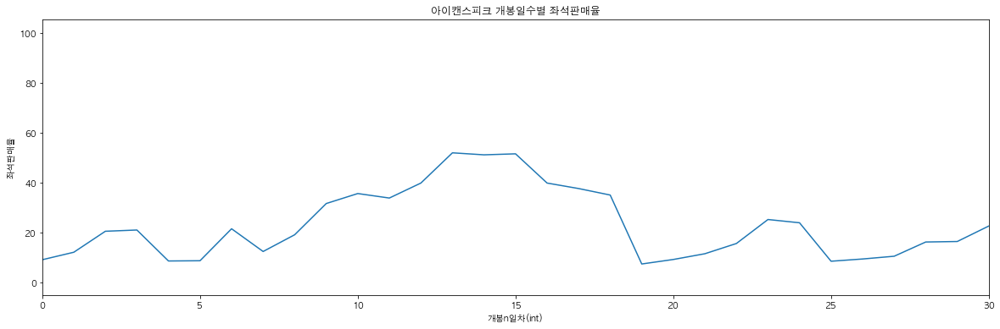

In [58]:
plt.figure(figsize=[20, 6])
plt.title("아이캔스피크 개봉일수별 좌석판매율")
ax= sns.lineplot(x='개봉n일차(int)', y='좌석판매율', data=ics)
ax.set(xlim=(0, 30))
plt.show()

In [59]:
df.groupby('F-rated')['좌석판매율'].mean()

F-rated
0   31.495499
1   28.443353
2   47.841333
Name: 좌석판매율, dtype: float64

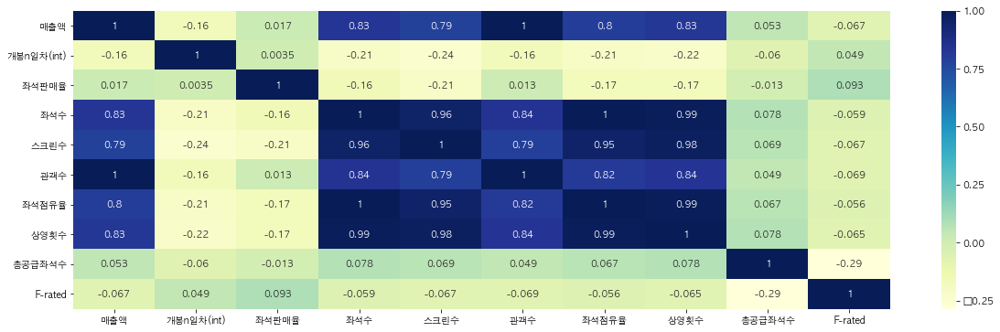

In [66]:
plt.figure(figsize=[20, 6])
sns.heatmap(df.corr(), annot=True, cmap='YlGnBu')
plt.show()

## 결과
- group 4 의 f rated 비율은 0>1>2 순, 3없음
- 박스오피스 결과는 주차별로 보이는 행태가 있음(주말이 주중보다 높고, 주단위로 값이 비슷함)
- group 4 의 F-rated 와 좌석판매율의 상관관계가 0.093 으로 **양수** -> **f rate 높을 수록 좌석판매율 높은 경우 많아**
- 그외의 매출액 등 흥행에 영향을 주는 모든 요소가 마이너스 값 -> f rate 높을 수록 그외의 요소는 낮음
- 매출액에서 가장 높은 상관관계: 0.83=좌석수=상영횟수. **좌석수가 흥행에 영향을 제일 높이 준다는 기존의 가설을 group4에서도 확인가능**
- f2 영화의 경우 후반까지(15일차, 25일차) 다소 **높은 좌석판매율**을 보여줌
- f2 영화의 경우 개봉 15일차 가면서 **좌석수**가 f0,f1에 비해 떨어짐


- 좌석판매율 평균
f0   31.495499
f1   28.443353
f2   47.841333

In [72]:
one=pd.read_csv('../01.Data_Collection/weekly_audi.csv')

In [76]:
one.head()

,영화명,개봉n주차,주차관객수
0,한여름의 판타지아,-22,0
1,한여름의 판타지아,1,374
2,한여름의 판타지아,2,8719
3,한여름의 판타지아,3,7597
4,한여름의 판타지아,4,5424


In [133]:
df =df.reset_index()

In [115]:
one[one['영화명']=='조선명탐정 : 사라진 놉의 딸'].head()

,영화명,개봉n주차,주차관객수
128,조선명탐정 : 사라진 놉의 딸,0,2894
129,조선명탐정 : 사라진 놉의 딸,1,5308
130,조선명탐정 : 사라진 놉의 딸,2,1199134
131,조선명탐정 : 사라진 놉의 딸,3,2083459
132,조선명탐정 : 사라진 놉의 딸,4,432951


In [114]:
df[df['영화명']=='조선명탐정 : 사라진 놉의 딸']

,영화명,점유율집계일,매출액,개봉n일차(int),좌석판매율,좌석수,스크린수,관객수,좌석점유율,상영횟수,총공급좌석수,F-rated
0,조선명탐정 : 사라진 놉의 딸,2015-02-02,6083000,-9,100.000000,869,4,869,0.040000,4,5203321.000000,1
1,조선명탐정 : 사라진 놉의 딸,2015-02-03,18225000,-8,100.000000,2025,9,2025,0.090000,9,5203321.000000,1
2,조선명탐정 : 사라진 놉의 딸,2015-02-04,23160000,-7,97.400000,2972,14,2895,0.130000,14,5203321.000000,1
3,조선명탐정 : 사라진 놉의 딸,2015-02-05,16891000,-6,99.500000,2425,7,2413,0.100000,7,5203321.000000,1
4,조선명탐정 : 사라진 놉의 딸,2015-02-11,853823300,0,14.900000,762037,740,113443,32.280000,3670,5203321.000000,1
5,조선명탐정 : 사라진 놉의 딸,2015-02-12,825063900,1,14.300000,771903,766,110284,32.180000,3741,5203321.000000,1
6,조선명탐정 : 사라진 놉의 딸,2015-02-13,1097163581,2,17.200000,802301,769,137631,32.540000,3889,5203321.000000,1
7,조선명탐정 : 사라진 놉의 딸,2015-02-14,2604862268,3,37.900000,850010,811,322022,32.470000,4111,5203321.000000,1
8,조선명탐정 : 사라진 놉의 딸,2015-02-15,2147212100,4,32.600000,828623,810,269925,32.380000,3985,5203321.000000,1
9,조선명탐정 : 사라진 놉의 딸,2015-02-16,728943900,5,12.600000,778462,751,97742,32.250000,3727,5203321.000000,1


In [136]:
weekly_df = df['점유율집계일'].resample('W-Mon', how={'점유율집계일':np.sum}).fillna(0)

TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'RangeIndex'

In [ ]:
df1 = df.resample('W-Mon', on='Date').sum()

In [80]:
sm =df[df['영화명']=='스물']
agss =df[df['영화명']=='아가씨']
mme =df[df['영화명']=='말모이']
ics =df[df['영화명']=='아이 캔 스피크']
cngc =df[df['영화명']=='청년경찰']

In [137]:
# plt.figure(figsize=[20, 6])
# plt.title("말모이")

# sns.barplot(x='개봉n주차', y='좌석수', data=mme, color='red')
# sns.barplot(x="개봉n주차", y="주차관객수", data=mme, color='black')
# # ax.set(xlim=(0, 30))
# plt.show()

### 1208

In [2]:
df=pd.read_csv('../01.Data_Collection/screens_final_with_group4_frate.csv')

In [20]:
df=df.drop(columns='Unnamed: 0',axis=1)

In [22]:
df.head()

,영화코드,영화명,개봉일,점유율집계일,개봉n일차,개봉n일차(int),상영횟수,상영점유율,상영점유율순위,스크린수,스크린점유율,스크린점유율순위,좌석수,좌석판매율,좌석점유율,좌석점유율순위,매출액,누적매출액,관객수,누적관객수,총공급좌석수,F-rated
0,20149570,조선명탐정 : 사라진 놉의 딸,2015-02-11,2015-02-02,-9 days +00:00:00.000000000,-9,4,0.047000,15,4,0.200000,14,869,100.000000,0.040000,12,6083000,6083000,869,869,5791947.000000,1
1,20149570,조선명탐정 : 사라진 놉의 딸,2015-02-11,2015-02-03,-8 days +00:00:00.000000000,-8,9,0.109000,10,9,0.400000,10,2025,100.000000,0.090000,10,18225000,24308000,2025,2894,5791947.000000,1
2,20149570,조선명탐정 : 사라진 놉의 딸,2015-02-11,2015-02-04,-7 days +00:00:00.000000000,-7,14,0.169000,9,14,0.600000,9,2972,97.400000,0.130000,9,23160000,47468000,2895,5789,5791947.000000,1
3,20149570,조선명탐정 : 사라진 놉의 딸,2015-02-11,2015-02-05,-6 days +00:00:00.000000000,-6,7,0.084000,13,7,0.300000,13,2425,99.500000,0.100000,11,16891000,64359000,2413,8202,5791947.000000,1
4,20149570,조선명탐정 : 사라진 놉의 딸,2015-02-11,2015-02-11,0 days 00:00:00.000000000,0,3670,46.036000,1,740,34.100000,1,762037,14.900000,32.280000,1,853823300,918182300,113443,121645,5791947.000000,1


In [23]:
df.groupby('F-rated')['영화명'].count()

F-rated
0    1792
1     566
2     581
Name: 영화명, dtype: int64

In [24]:
# values= df.groupby('F-rated')['영화명'].count()
fig = go.Figure(data=[go.Pie(labels=[0,1,2], values=[1792,566,581])])
fig.update_layout(
    title="F-rate ratio")
fig.show()

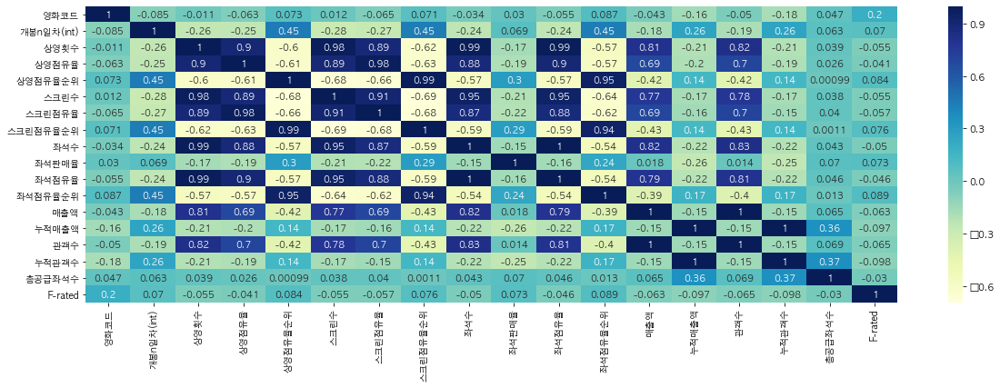

In [25]:
plt.figure(figsize=[20, 6])
sns.heatmap(df.corr(), annot=True, cmap='YlGnBu')
plt.show()

In [26]:
df.groupby('F-rated')['좌석판매율'].mean()

F-rated
0   29.463393
1   27.249293
2   36.830637
Name: 좌석판매율, dtype: float64

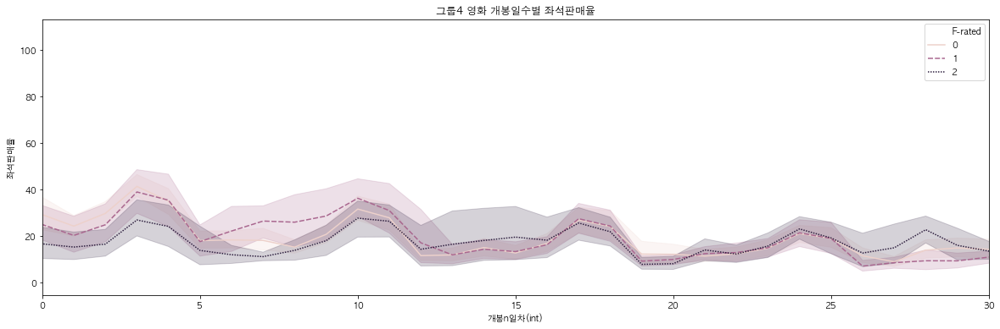

In [27]:
plt.figure(figsize=[20, 6])
plt.title("그룹4 영화 개봉일수별 좌석판매율")
ax= sns.lineplot(x='개봉n일차(int)', y='좌석판매율', data=df, style='F-rated', hue='F-rated')
ax.set(xlim=(0, 30))
plt.show()

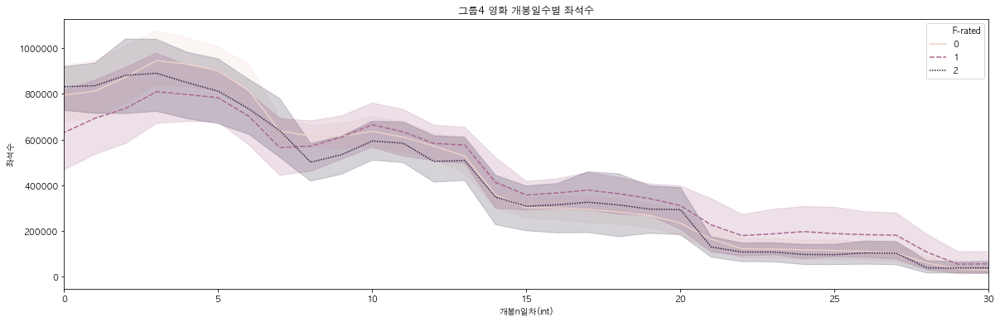

In [28]:
plt.figure(figsize=[20, 6])
plt.title("그룹4 영화 개봉일수별 좌석수")
ax= sns.lineplot(x='개봉n일차(int)', y='좌석수', data=df, style='F-rated', hue='F-rated')
ax.set(xlim=(0, 30))
plt.show()

In [29]:
fig = px.scatter(df, x="좌석수", y="관객수", color="F-rated",
                 size='매출액')
fig.show()

In [31]:
print(df[df['F-rated']==0]['영화명'].unique())
print(df[df['F-rated']==1]['영화명'].unique())
print(df[df['F-rated']==2]['영화명'].unique())

['스물' '인천상륙작전' '아수라' '판도라' '재심' '조작된 도시' '프리즌' '보안관' '박열' '군함도' '살인자의 기억법'
 '남한산성' '강철비' '그것만이 내 세상' '사라진 밤' '지금 만나러 갑니다' '곤지암' '바람 바람 바람' '목격자' '공작'
 '창궐' '내안의 그놈' '증인' '사바하']
['조선명탐정 : 사라진 놉의 딸' '귀향' '시간이탈자' '덕혜옹주' '형' '조선명탐정: 흡혈괴마의 비밀' '마녀' '변신']
['아가씨' '아이 캔 스피크' '리틀 포레스트' '말모이' '생일' '유열의 음악앨범']


In [37]:
f0 = df[df['F-rated']==0]
f1 = df[df['F-rated']==1]
f2 = df[df['F-rated']==2]

In [44]:
df.sort_values(by='좌석판매율',ascending=False).head()

,영화코드,영화명,개봉일,점유율집계일,개봉n일차,개봉n일차(int),상영횟수,상영점유율,상영점유율순위,스크린수,스크린점유율,스크린점유율순위,좌석수,좌석판매율,좌석점유율,좌석점유율순위,매출액,누적매출액,관객수,누적관객수,총공급좌석수,F-rated
2305,20179101,공작,2018-08-08,2018-08-02,-6 days +00:00:00.000000000,-6,8,0.061000,10,6,0.200000,10,2925,148.700000,0.100000,7,40394000,73014000,4348,7970,6705898.000000,0
824,20144641,판도라,2016-12-07,2019-09-20,1017 days 00:00:00.000000000,1017,1,0.009000,26,1,0.000000,25,114,107.900000,0.000000,32,861000,36069197064,123,4585116,6825041.000000,0
1101,20178982,박열,2017-06-28,2017-06-15,-13 days +00:00:00.000000000,-13,1,0.012000,22,1,0.000000,19,300,106.300000,0.010000,19,2233000,18643000,319,2447,4766292.000000,0
969,20162181,프리즌,2017-03-23,2017-03-21,-2 days +00:00:00.000000000,-2,13,0.556000,7,13,1.300000,7,3402,104.400000,0.140000,6,28259000,200341000,3551,23098,6288066.000000,0
1871,20170841,리틀 포레스트,2018-02-28,2019-06-22,479 days 00:00:00.000000000,479,1,0.017000,16,1,0.100000,14,55,101.800000,0.000000,24,336000,11934249185,56,1506911,4473438.000000,2
1858,20170841,리틀 포레스트,2018-02-28,2018-09-17,201 days 00:00:00.000000000,201,1,0.011000,30,1,0.000000,24,160,101.300000,0.010000,28,972000,11925790185,162,1505722,4473438.000000,2
47,20149570,조선명탐정 : 사라진 놉의 딸,2015-02-11,2015-03-27,44 days 00:00:00.000000000,44,1,0.017000,17,1,0.100000,14,94,101.100000,0.000000,29,570000,30456879428,95,3872015,5791947.000000,1
2120,20153447,바람 바람 바람,2018-04-05,2018-03-29,-7 days +00:00:00.000000000,-7,6,0.059000,15,6,0.200000,14,1274,100.900000,0.050000,14,6952000,62658000,1286,7867,4052581.000000,0
1328,20174142,아이 캔 스피크,2017-09-21,2017-09-12,-9 days +00:00:00.000000000,-9,6,0.066000,14,6,0.200000,14,1052,100.400000,0.040000,14,8448000,113420000,1056,13345,5723459.000000,2
1405,20174142,아이 캔 스피크,2017-09-21,2017-12-02,72 days 00:00:00.000000000,72,2,0.018000,24,2,0.100000,20,598,100.200000,0.020000,17,5873000,25500565186,599,3274351,5723459.000000,2


In [43]:
print(f2.groupby('영화명')['좌석판매율'].mean())
print(f1.groupby('영화명')['좌석판매율'].mean())
print(f0.groupby('영화명')['좌석판매율'].mean())

영화명
리틀 포레스트    31.658716
말모이        47.996842
생일         35.294805
아가씨        26.813274
아이 캔 스피크   47.727692
유열의 음악앨범   25.191228
Name: 좌석판매율, dtype: float64
영화명
귀향                 27.995495
덕혜옹주               33.453465
마녀                 26.016923
변신                 25.924074
시간이탈자              22.017391
조선명탐정 : 사라진 놉의 딸   25.156000
조선명탐정: 흡혈괴마의 비밀    25.818333
형                  25.646835
Name: 좌석판매율, dtype: float64
영화명
강철비          24.687500
곤지암          21.716667
공작           28.992553
군함도          36.346250
그것만이 내 세상    40.921978
남한산성         31.753247
내안의 그놈       42.927273
목격자          30.551064
바람 바람 바람     14.382432
박열           28.993976
보안관          31.485135
사라진 밤        12.151667
사바하          17.824074
살인자의 기억법     22.190625
스물           27.541975
아수라          26.382258
인천상륙작전       37.625490
재심           27.632857
조작된 도시       35.610937
증인           32.705063
지금 만나러 갑니다   27.921277
창궐           26.294000
판도라          42.017500
프리즌          24.784615
Name: 좌석판매율, dtype: fl

In [9]:
mme= df[df['영화명']=='말모이']
dhoj= df[df['영화명']=='덕혜옹주']
ngn= df[df['영화명']=='내안의 그놈']
sbh= df[df['영화명']=='사바하']

결과
- group 4 의 f rated 비율은 0>2>1 순, 3없음
- 박스오피스 결과는 주차별로 보이는 행태가 있음(주말이 주중보다 높고, 주단위로 값이 비슷함)
- group 4 의 F-rated 와 좌석판매율의 상관관계가 0.073 으로 양수 -> f rate 높을 수록 좌석판매율 높은 경우 많아
- 그외의 매출액 등 흥행에 영향을 주는 모든 요소가 마이너스 값 -> f rate 높을 수록 그외의 요소는 낮음
- 매출액에서 가장 높은 상관관계: 관객수 1, 좌석수0.82
- f2 영화의 경우 후반까지(15일차, 25일차) 다소 높은 좌석판매율을 보여줌
- f0 영화의 경우 개봉 초반만(~3일차) 좌석판매율이 1등이고 그 후는 거의 없음(20일차정도만)
- 좌석수는 딱히 없음

- 좌석판매율 평균 f2   36.830637
f1   27.249293
 f0   29.463393
- 1등 영화들
f2 말모이        47.996842
f1 덕혜옹주               33.453465
f0 내안의 그놈       42.927273

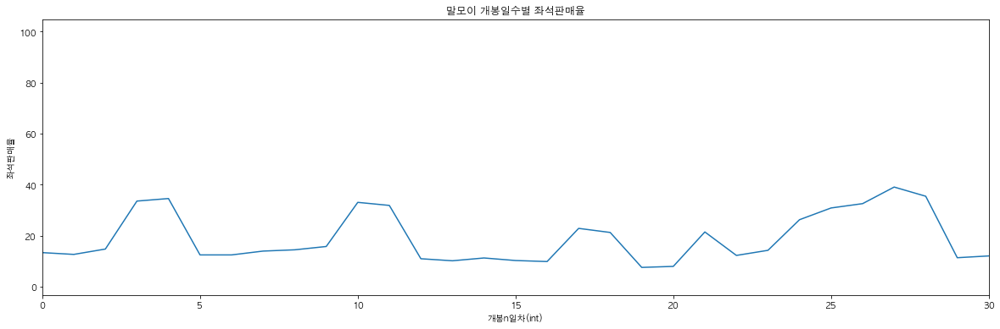

In [46]:
plt.figure(figsize=[20, 6])
plt.title("말모이 개봉일수별 좌석판매율")
ax= sns.lineplot(x='개봉n일차(int)', y='좌석판매율', data=mme)
ax.set(xlim=(0, 30))
plt.show()

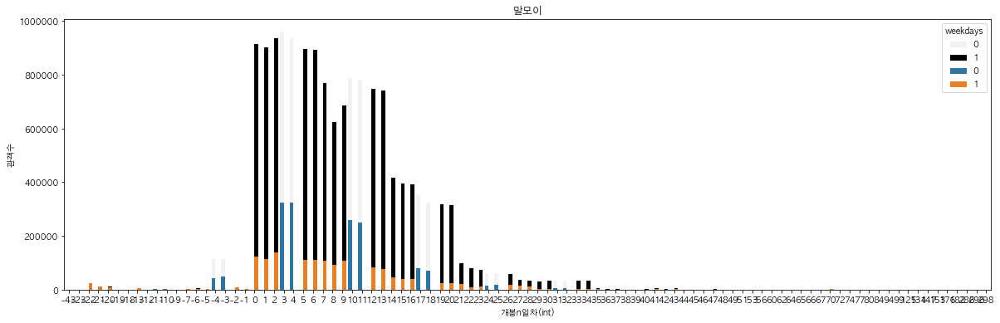

In [11]:
plt.figure(figsize=[20, 6])
plt.title("말모이")

sns.barplot(x='개봉n일차(int)', y='좌석수', data=mme, color='black', hue='weekdays')
sns.barplot(x="개봉n일차(int)", y="관객수", data=mme, hue='weekdays')
# ax.set(xlim=(0, 30))
plt.show()

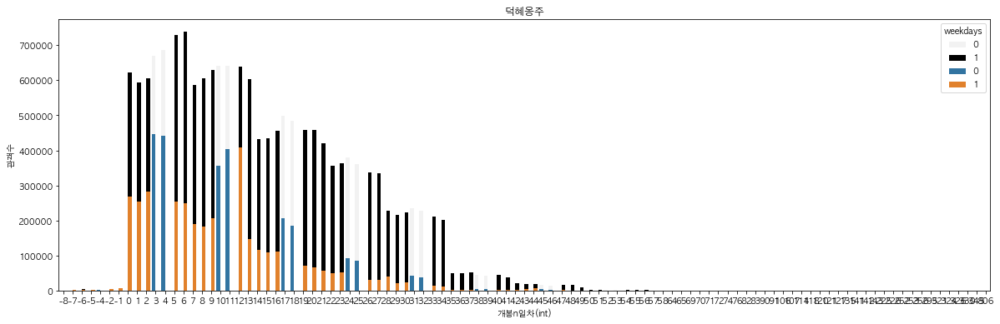

In [12]:
plt.figure(figsize=[20, 6])
plt.title("덕혜옹주")

sns.barplot(x='개봉n일차(int)', y='좌석수', data=dhoj, color='black',hue='weekdays')
sns.barplot(x="개봉n일차(int)", y="관객수", data=dhoj,hue='weekdays')
# ax.set(xlim=(0, 30))
plt.show()

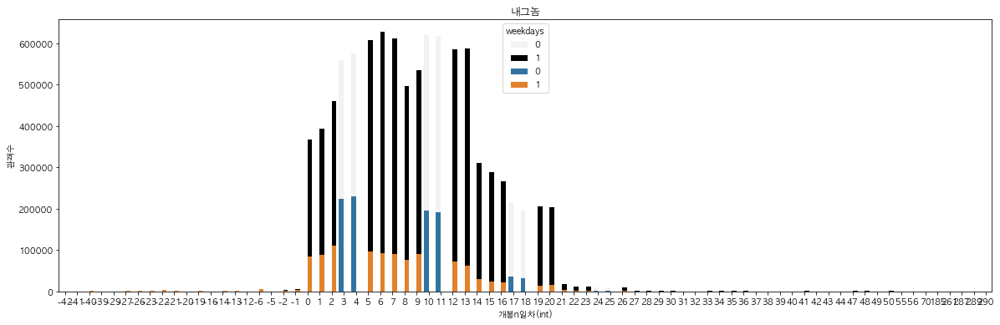

In [15]:
plt.figure(figsize=[20, 6])
plt.title("내그놈")

sns.barplot(x='개봉n일차(int)', y='좌석수', data=ngn, color='black',hue='weekdays')
sns.barplot(x="개봉n일차(int)", y="관객수", data=ngn,hue='weekdays')
# ax.set(xlim=(0, 30))
plt.show()

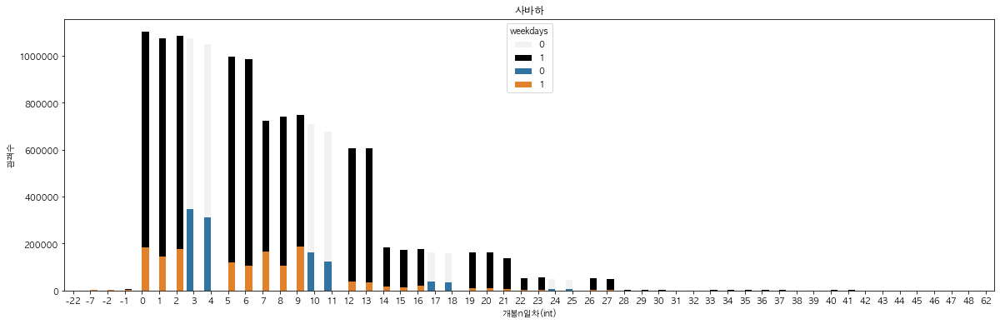

In [16]:
plt.figure(figsize=[20, 6])
plt.title("사바하")

sns.barplot(x='개봉n일차(int)', y='좌석수', data=sbh, color='black',hue='weekdays')
sns.barplot(x="개봉n일차(int)", y="관객수", data=sbh,hue='weekdays')
# ax.set(xlim=(0, 30))
plt.show()

In [4]:
df['점유율집계일'] =pd.to_datetime(df['점유율집계일'], format='%Y-%m-%d')

In [5]:
df['day']=df['점유율집계일'].dt.weekday

In [6]:
df["weekdays"] = (df["day"] < 5).astype(int)